In [ ]:
# NIANE_MOUHAMADOU Notebook
Dans ce notebook, nous allons procéder à l'extraction de caractéristiques de données, 
effectuer une analyse de données pour vérifier la présence de valeurs manquantes, 
et finalement, effectuer une réduction de dimensionnalité en utilisant un classificateur d'arbres pour sélectionner les caractéristiques importantes.


# Analyse des données de capteurs

Ce notebook vise à analyser des données provenant de différents capteurs. Il extrait des caractéristiques telles que la température, l'humidité, la luminosité, le CO2, le taux d'humidité et l'occupation à partir des données brutes et effectue des analyses statistiques de base.

Les données sont organisées en fenêtres temporelles avec un chevauchement possible entre elles.


In [4]:
import numpy as np
import os
import pandas as pd
import time
import pickle
import scipy.stats as stats
from sklearn import preprocessing
from sklearn.ensemble import ExtraTreesClassifier
from matplotlib import pyplot as plt

pd.set_option('display.max_columns', None)


# Fonctions d'extraction de caractéristiques
Nous définissons ici un ensemble de fonctions qui nous aideront à extraire des caractéristiques statistiques de base des données.


In [5]:
def extract_min(data):
    return np.min(data, axis=0)

def extract_max(data):
    return np.max(data, axis=0)

def extract_mean(data):
    return np.mean(data, axis=0)

def extract_std(data):
    return np.std(data, axis=0)

def extract_skw(data):
    return stats.skew(data, axis=0)

def extract_kurtosis(data):
    return stats.kurtosis(data, axis=0)

def extract_feature(data):
    tmp = extract_min(data)
    tmp = np.append(tmp, extract_max(data))
    tmp = np.append(tmp, extract_mean(data))
    tmp = np.append(tmp, extract_skw(data))
    tmp = np.append(tmp, extract_std(data))
    tmp = np.append(tmp, extract_kurtosis(data))
    return tmp, ['min', 'max', 'mean', 'skewed', 'std', 'kurtosis']


# Extraction de caractéristiques
Maintenant, nous allons extraire des caractéristiques de l'ensemble de données en utilisant les fonctions définies précédemment.


In [6]:
# User parameters
base_path = "Data"
object_list = ["Temperature", "Humidity", "Light", "CO2", "HumidityRatio", "Occupancy"]

# 1.5 sec et 1 sec respectivement
time_window_length = 5
overlap_length = 10

dataset_name = "NewDatatest"

# Initialization
file_list = os.listdir(base_path)
non_overlap_length = time_window_length - overlap_length
values_data = []
label_data = []
total_time = 0

# Create dataset
for file_name in file_list:
    print("     -" + str(file_name))
    temp_path = os.path.join(base_path, file_name)
    
    # Check if the file is a text file before reading it
    if file_name.endswith('.txt') or file_name.endswith('.csv'):
        raw_data = pd.read_table(temp_path, sep=',', engine='python', usecols=object_list)
        # Rest of the code...

        column_names = raw_data.columns
        data_to_use = raw_data.values

        # Convert data to float
        for k in range(data_to_use.shape[0]):
            for j in range(1, data_to_use.shape[1]):
                if not isinstance(data_to_use[k, j], float):
                    data_to_use[k, j] = float(data_to_use[k, j])

        # Extract features
        for object in object_list:
            for k in range(data_to_use.shape[0] - time_window_length):
                x = data_to_use[k: k + time_window_length]
                start_time = time.time()

                vector, features = extract_feature(x)

                end_time = time.time()
                total_time += end_time - start_time

                values_data.append(vector)
            label_data.append(object)

new_column_names = []
for feature in features:
    for column_name in column_names:
        new_column_names.append(f"{feature}_{column_name}")

values_data = pd.DataFrame(values_data, columns=new_column_names)

print(f"Time to extract: {total_time}")
print(f"\nTotal size: {values_data.shape[0]}X{values_data.shape[1]}")
print(f"\nNumber of labels: {len(label_data)}")

     -datatest.txt
Time to extract: 9.031866788864136

Total size: 15960X36

Number of labels: 6


## Sauvegarde du jeu de données

Après l'extraction des caractéristiques, nous sauvegardons le jeu de données dans un fichier pickle pour une utilisation ultérieure. Cela permet de ne pas avoir à réexécuter l'extraction de caractéristiques chaque fois que nous voulons analyser les données.


In [10]:
# Save dataset
with open(os.path.join(base_path, dataset_name + ".pickle"), "wb") as f:
    pickle.dump([values_data, label_data], f)


lire les données chargées

In [11]:
import os
import pickle
import pandas as pd

# Définir le chemin où le fichier .pickle a été enregistré
pickle_file_path = os.path.join(base_path, dataset_name + ".pickle")

# Charger et afficher le contenu du fichier .pickle
try:
    with open(pickle_file_path, 'rb') as file:
        # Charger les données depuis le fichier pickle
        loaded_data, loaded_labels = pickle.load(file)
        
        # Afficher les données chargées
        print("Données chargées:")
        print(loaded_data)
        print("Labels chargés:")
        print(loaded_labels)
except FileNotFoundError:
    print(f"Le fichier {pickle_file_path} n'a pas été trouvé.")
except Exception as e:
    print(f"Une erreur s'est produite: {e}")


Données chargées:
       min_Temperature  min_Humidity  min_Light      min_CO2  \
0              23.7000        26.125      488.6   749.200000   
1              23.7180        26.125      488.6   760.400000   
2              23.7225        26.125      488.6   769.666667   
3              23.7225        26.125      488.6   774.750000   
4              23.7300        26.200      476.0   779.000000   
...                ...           ...        ...          ...   
15955          24.2000        25.852      787.0  1140.800000   
15956          24.2180        25.700      793.0  1140.800000   
15957          24.2600        25.700      793.0  1129.200000   
15958          24.2900        25.700      793.0  1125.800000   
15959          24.2900        25.700      801.4  1123.000000   

       min_HumidityRatio  min_Occupancy  max_Temperature  max_Humidity  \
0               0.004744            1.0        23.754000        26.290   
1               0.004744            1.0        23.760000        2

# Analyse des données
Nous allons maintenant vérifier la présence de valeurs manquantes dans l'ensemble de données.


In [12]:
df = pd.read_table("datatraining.txt", sep=",")
print(df.isna().sum())


date             0
Temperature      0
Humidity         0
Light            0
CO2              0
HumidityRatio    0
Occupancy        0
dtype: int64


# Réduction de dimensionnalité
Dans cette section, nous allons effectuer une réduction de dimensionnalité en utilisant un classificateur d'arbres pour sélectionner les caractéristiques importantes.


Ancien dataset:
       index  min_Temperature  min_Humidity  min_Light      min_CO2  \
0          0          23.7000        26.125      488.6   749.200000   
1          1          23.7180        26.125      488.6   760.400000   
2          2          23.7225        26.125      488.6   769.666667   
3          3          23.7225        26.125      488.6   774.750000   
4          4          23.7300        26.200      476.0   779.000000   
...      ...              ...           ...        ...          ...   
15955  15955          24.2000        25.852      787.0  1140.800000   
15956  15956          24.2180        25.700      793.0  1140.800000   
15957  15957          24.2600        25.700      793.0  1129.200000   
15958  15958          24.2900        25.700      793.0  1125.800000   
15959  15959          24.2900        25.700      801.4  1123.000000   

       min_HumidityRatio  min_Occupancy  max_Temperature  max_Humidity  \
0               0.004744            1.0        23.754000 

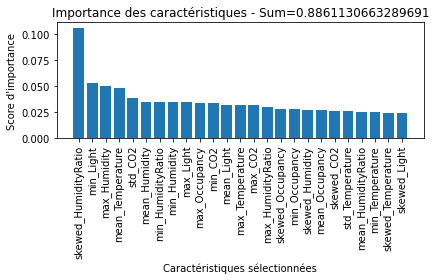

In [13]:
path_name = "data/NewDatatest.pickle"
attribute_number_to_select = 25
new_dataset_path_name = "data"
new_dataset_name = f"Selected_Features_{attribute_number_to_select}_dataset_15_10"

with open(path_name, "rb") as file:
    df, y = pickle.load(file)

df = df.replace([np.inf, -np.inf], np.nan)
df = df.dropna()
df = df.reset_index()
print("Ancien dataset:")
print(df)

y = df['kurtosis_Occupancy']
X = df.drop(['kurtosis_Occupancy','min_Occupancy','max_Occupancy','mean_Occupancy','skewed_Occupancy','std_Occupancy'], axis=1)

classifier_model = ExtraTreesClassifier(n_estimators=50)
lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)
classifier_model = classifier_model.fit(X, y)

importance_score = classifier_model.feature_importances_
indices = np.argsort(importance_score)[::-1]
columns_to_select = df.columns[indices[0:attribute_number_to_select]]

new_dataset = df[columns_to_select]
print("Nouveau dataset:")
print(new_dataset)

plt.bar(x=np.arange(attribute_number_to_select), height=importance_score[indices[0:attribute_number_to_select]],
        tick_label=columns_to_select)
plt.title("Importance des caractéristiques - Sum=" + str(np.sum(importance_score[indices[0:attribute_number_to_select]])))
plt.xlabel("Caractéristiques sélectionnées")
plt.xticks(rotation=90)
plt.ylabel("Score d'importance")
plt.tight_layout()
plt.show()

with open(os.path.join(new_dataset_path_name, new_dataset_name + ".pickle"), "wb") as f:
    pickle.dump([new_dataset, y], f)


## Exploration de Données (EDA)


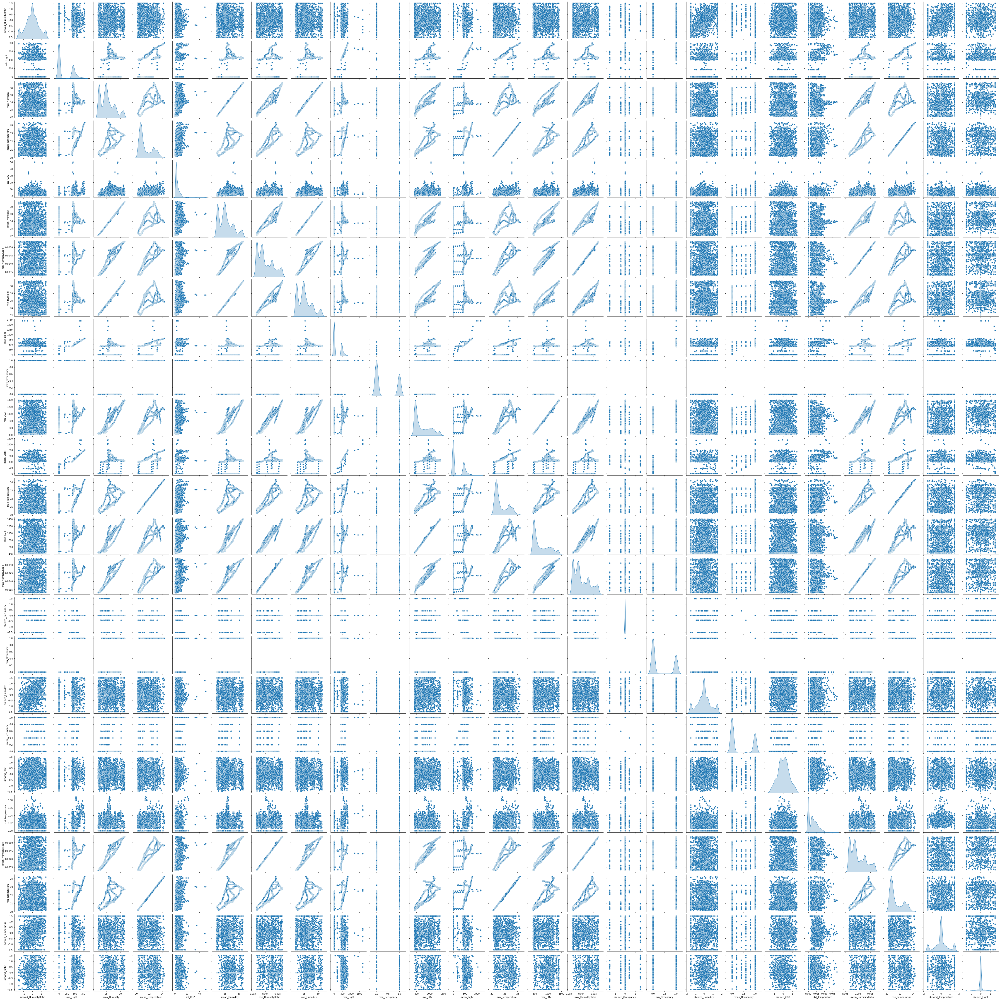

In [14]:
import seaborn as sns

# Visualisation de la distribution des données
sns.pairplot(new_dataset, diag_kind='kde')


<AxesSubplot:>

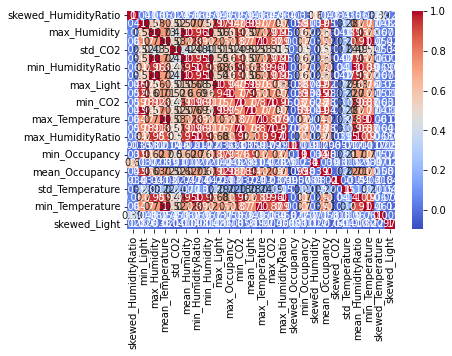

In [15]:
# Représentation des corrélations entre différentes caractéristiques
corr_matrix = new_dataset.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Remplacer par le code pour charger votre ensemble de données
new_dataset = pd.read_table('data/datatest.txt')

# Visualisation de la distribution des données
sns.pairplot(new_dataset, diag_kind='kde')

# Représentation des corrélations entre différentes caractéristiques
corr_matrix = new_dataset.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Afficher les graphiques
plt.show()

# Analyser les valeurs manquantes
print("\nValeurs manquantes par caractéristique:")
print(new_dataset.isnull().sum())

# Identifier les valeurs aberrantes via la méthode des IQR (Interquartile Range)
Q1 = new_dataset.quantile(0.25)
Q3 = new_dataset.quantile(0.75)
IQR = Q3 - Q1
print("\nValeurs aberrantes:")
print(((new_dataset < (Q1 - 1.5 * IQR)) | (new_dataset > (Q3 + 1.5 * IQR))).sum())


ValueError: No variables found for grid columns.

# Améliorations potentielles
Voici plusieurs aspects qui pourraient être ajoutés au notebook pour une analyse plus complète et une meilleure performance du modèle.


Une amélioration du notebook pourrait inclure plusieurs aspects additionnels qui peuvent aider à explorer davantage les données, améliorer la performance du modèle et la présentation des résultats.

    Exploration de Données (EDA):
        Visualisation de la distribution des données (histogrammes, boîtes à moustaches).
        Représentation des corrélations entre différentes caractéristiques.
        Analyse de la qualité des données (valeurs manquantes, valeurs aberrantes).

    Prétraitement des Données:
        Normalisation ou standardisation des données.
        Remplacement des valeurs manquantes par des méthodes avancées comme KNN Imputer.
        Suppression ou transformation des caractéristiques ayant une faible variance.

    Ingénierie des Caractéristiques:
        Création de nouvelles caractéristiques qui pourraient être pertinentes pour la modélisation.
        Utilisation de méthodes avancées d'extraction de caractéristiques comme les auto-encodeurs.

    Sélection des Caractéristiques:
        En plus de ExtraTreesClassifier, utiliser des méthodes comme la sélection récursive de caractéristiques, ou les méthodes de filtrage basées sur l'information mutuelle.

    Expérimentation avec Divers Modèles de Machine Learning:
        Essayer différents algorithmes de machine learning pour la modélisation.
        Utiliser la validation croisée pour estimer la performance du modèle.

    Optimisation des Hyperparamètres:
        Utiliser la recherche par grille ou la recherche aléatoire pour optimiser les hyperparamètres du modèle.

    Evaluation du Modèle:
        Calcul de diverses métriques d'évaluation.
        Création de courbes ROC, matrices de confusion pour une évaluation visuelle.

    Interprétabilité du Modèle:
        Utiliser des outils comme SHAP (SHapley Additive exPlanations) pour interpréter les contributions des caractéristiques.

    Déploiement du Modèle:
        Fournir des directives sur comment déployer le modèle dans un environnement de production.

    Documentation et Commentaires:
        Ajouter davantage de commentaires et de documentation pour expliquer le raisonnement derrière chaque étape.

En intégrant ces éléments dans votre notebook, vous pouvez créer un pipeline de machine learning plus robuste et complet, qui non seulement vous aidera à mieux comprendre les données, mais aussi à améliorer les performances de votre modèle.

In [ ]:
# Conclusion
En intégrant ces éléments dans votre notebook, vous pouvez créer un pipeline de machine learning plus robuste et complet, qui non seulement vous aidera à mieux comprendre les données, mais aussi à améliorer les performances de votre modèle.
